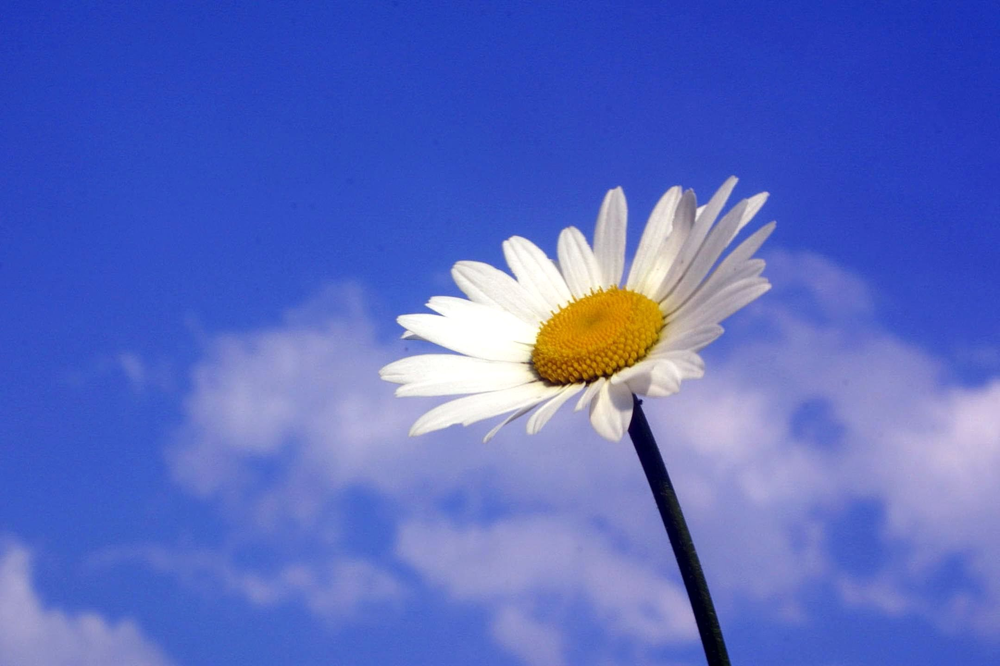

In [ ]:
from PIL import Image

image = Image.open('/content/Flower_stock_photo.jpg')
image

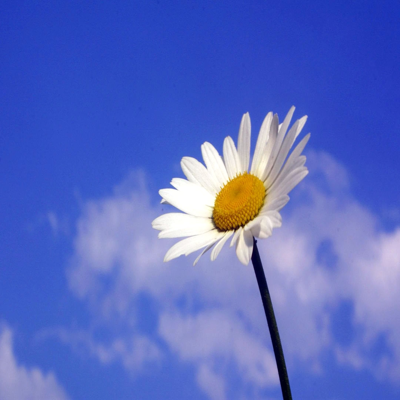

In [ ]:
image_resized = image.resize((400,400))
image_resized

NORMALIZATION

In [ ]:
import numpy as np
image_array = np.array(image)
image_array

array([[[ 36,  61, 187],
        [ 34,  59, 185],
        [ 32,  57, 183],
        ...,
        [ 32,  53, 181],
        [ 33,  54, 182],
        [ 34,  55, 183]],

       [[ 34,  59, 185],
        [ 33,  58, 184],
        [ 33,  58, 184],
        ...,
        [ 32,  53, 181],
        [ 33,  54, 182],
        [ 33,  54, 182]],

       [[ 32,  57, 183],
        [ 33,  58, 184],
        [ 33,  58, 184],
        ...,
        [ 31,  52, 180],
        [ 32,  53, 181],
        [ 32,  53, 181]],

       ...,

       [[135, 137, 198],
        [134, 136, 197],
        [131, 133, 194],
        ...,
        [ 64,  88, 194],
        [ 64,  88, 194],
        [ 64,  88, 194]],

       [[134, 136, 197],
        [132, 134, 195],
        [129, 131, 192],
        ...,
        [ 64,  88, 194],
        [ 65,  89, 195],
        [ 65,  89, 195]],

       [[133, 135, 196],
        [131, 133, 194],
        [128, 130, 191],
        ...,
        [ 64,  88, 194],
        [ 65,  89, 195],
        [ 65,  89, 195]]

In [ ]:
image_array_scaled = np.array(image)/255.0
image_array_scaled

array([[[0.14117647, 0.23921569, 0.73333333],
        [0.13333333, 0.23137255, 0.7254902 ],
        [0.1254902 , 0.22352941, 0.71764706],
        ...,
        [0.1254902 , 0.20784314, 0.70980392],
        [0.12941176, 0.21176471, 0.71372549],
        [0.13333333, 0.21568627, 0.71764706]],

       [[0.13333333, 0.23137255, 0.7254902 ],
        [0.12941176, 0.22745098, 0.72156863],
        [0.12941176, 0.22745098, 0.72156863],
        ...,
        [0.1254902 , 0.20784314, 0.70980392],
        [0.12941176, 0.21176471, 0.71372549],
        [0.12941176, 0.21176471, 0.71372549]],

       [[0.1254902 , 0.22352941, 0.71764706],
        [0.12941176, 0.22745098, 0.72156863],
        [0.12941176, 0.22745098, 0.72156863],
        ...,
        [0.12156863, 0.20392157, 0.70588235],
        [0.1254902 , 0.20784314, 0.70980392],
        [0.1254902 , 0.20784314, 0.70980392]],

       ...,

       [[0.52941176, 0.5372549 , 0.77647059],
        [0.5254902 , 0.53333333, 0.77254902],
        [0.51372549, 0

In [ ]:
from cv2 import cvtColor, COLOR_BGR2GRAY
image_np = np.array(image)
grayscale_image = cvtColor(image_np, COLOR_BGR2GRAY)
grayscale_image
#cv doesnot show the greyscaled image of every images there is a limitation, imageops is better for showing that, i used that library to show that too.

array([[ 96,  94,  92, ...,  89,  90,  91],
       [ 94,  93,  93, ...,  89,  90,  90],
       [ 92,  93,  93, ...,  88,  89,  89],
       ...,
       [155, 154, 151, ..., 117, 117, 117],
       [154, 152, 149, ..., 117, 118, 118],
       [153, 151, 148, ..., 117, 118, 118]], dtype=uint8)

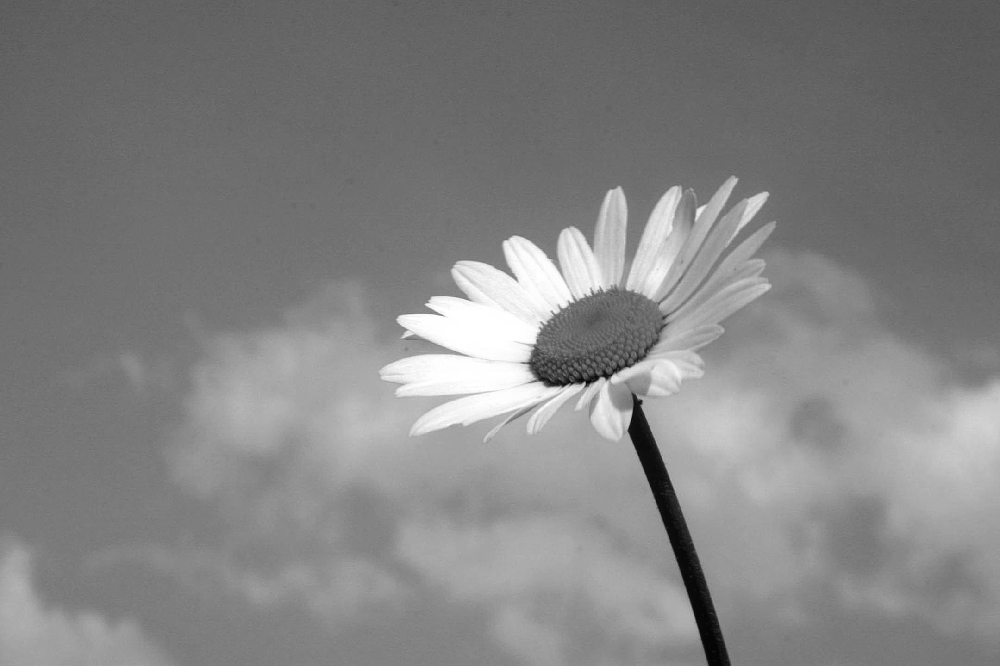

In [ ]:
from PIL import Image

gray_pil = Image.fromarray(grayscale_image)
gray_pil

DATA AUGMENTATION

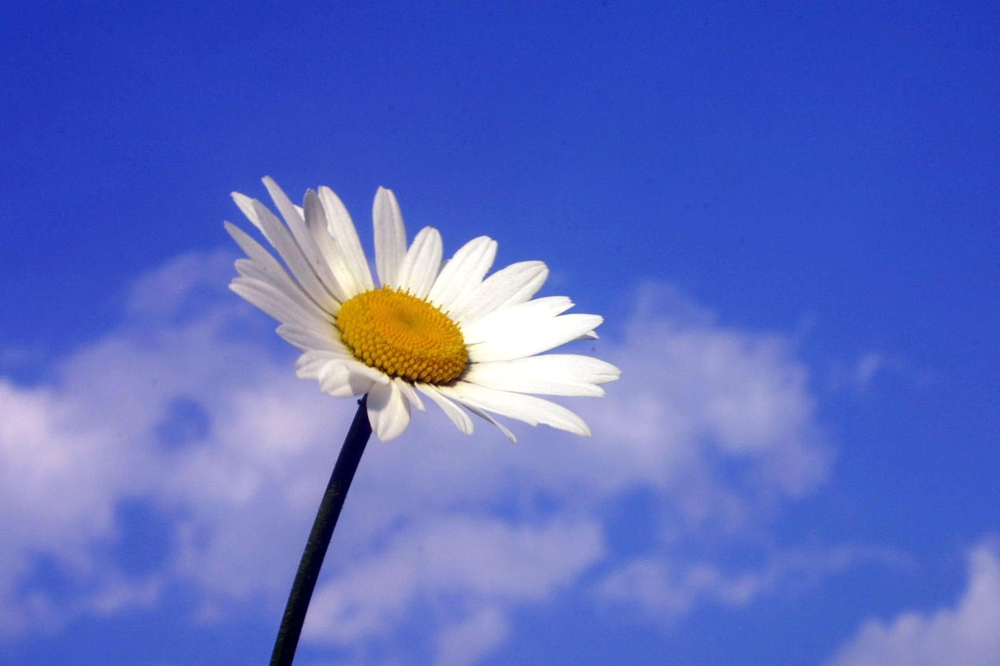

In [ ]:
from PIL import Image, ImageEnhance, ImageOps

flipped = ImageOps.mirror(image)
flipped

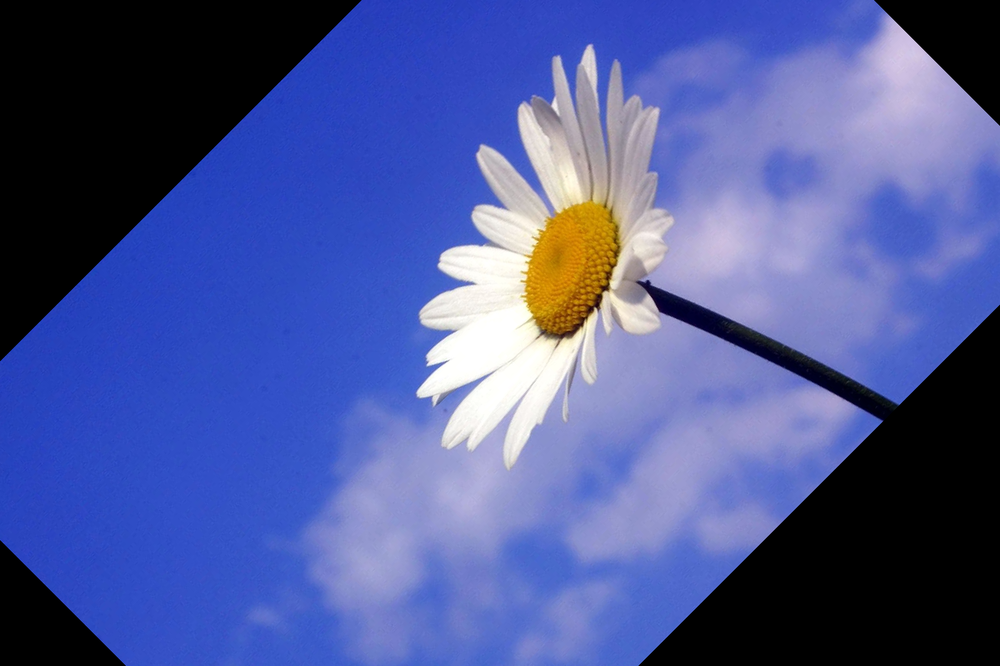

In [ ]:
rotated = image.rotate(45)
rotated

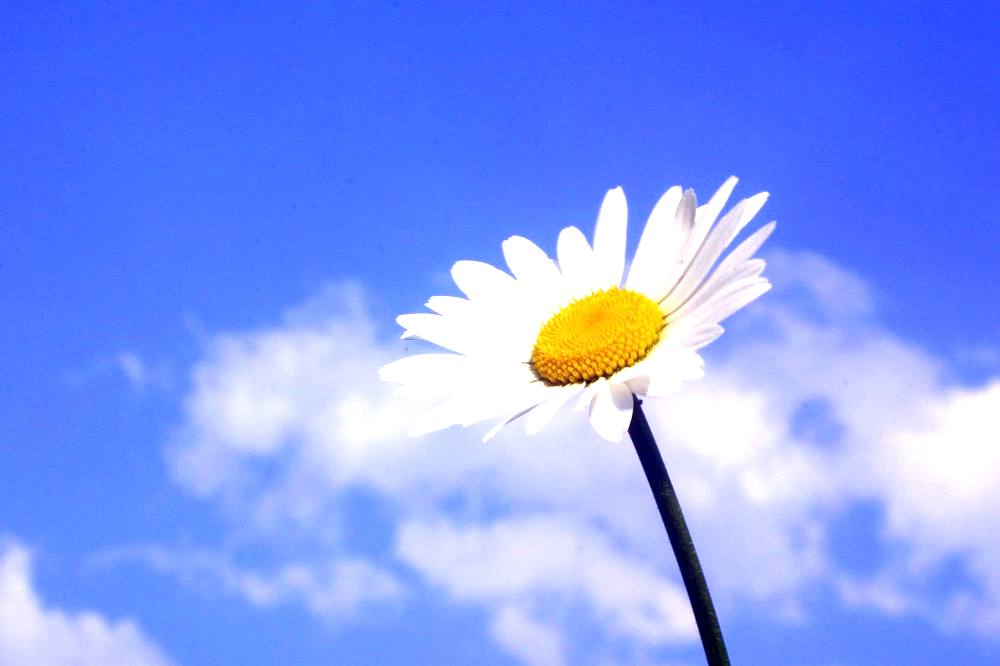

In [ ]:
enhancer = ImageEnhance.Brightness(image)
brighter = enhancer.enhance(1.5)
brighter

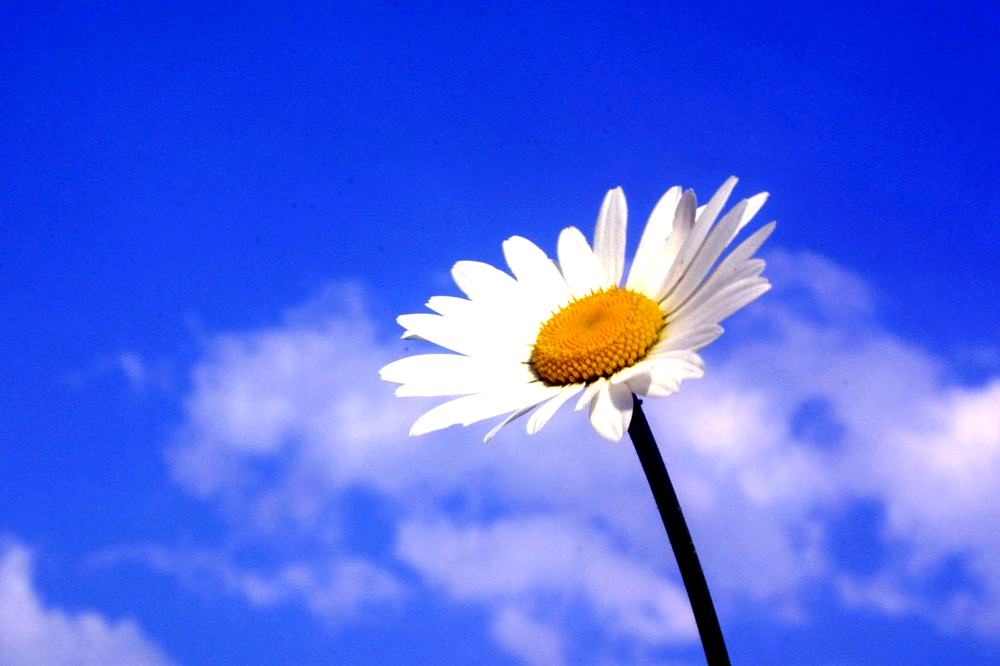

In [ ]:
contrast = ImageEnhance.Contrast(image)
enhanced = contrast.enhance(1.5)
enhanced

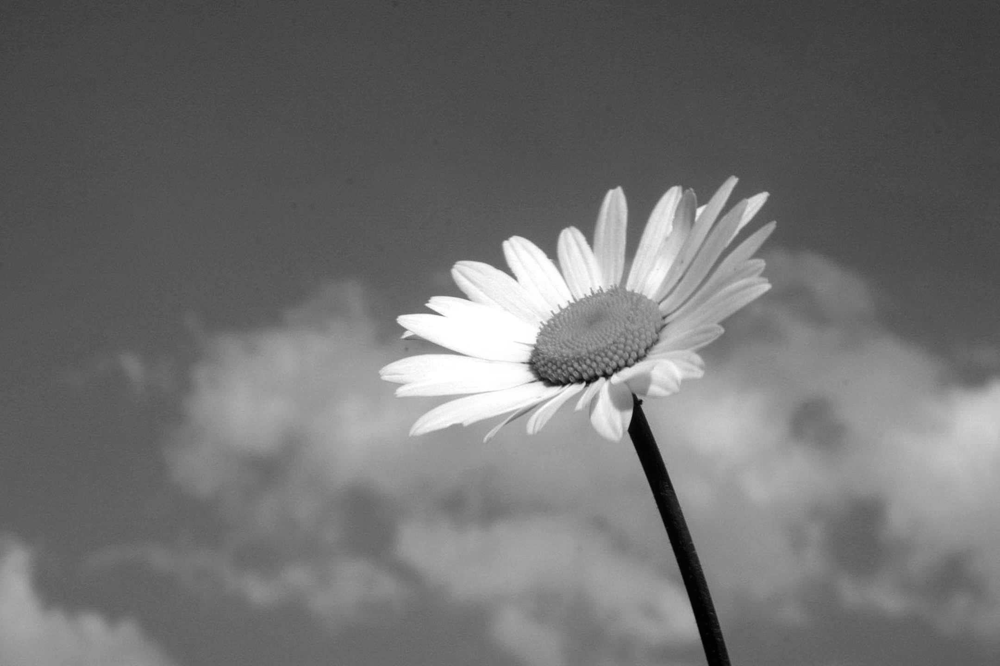

In [ ]:
grayscale = ImageOps.grayscale(image)
grayscale

In [ ]:
from PIL import Image, ImageEnhance, ImageOps
#PIL: Python Imaging Library (via Pillow), used for image processing.
#Image: Handles image loading, saving, and manipulation.
#ImageEnhance: Provides tools for enhancing image properties like brightness and contrast.
#ImageOps: Contains image processing utilities, such as flipping and grayscaling.
#os: A module to handle file system operations like creating directories and file paths.

import os

# Load the uploaded image
image_path = "/content/Flower_stock_photo.jpg"  # Replace with your image file path
image = Image.open(image_path)

# Create a directory for augmented images
augmented_dir = "augmented_images"
#Creates the directory augmented_images
os.makedirs(augmented_dir, exist_ok=True)
 #Ensures no error is raised if the directory already exists.

# Augmentation functions
def augment_image(image, output_dir):
    # 1. Horizontal Flip
    # Flips the image horizontally (mirroring).
    flipped = ImageOps.mirror(image)
    #Saves the flipped image as flipped.jpeg in the output_dir
    flipped.save(os.path.join(output_dir, "flipped.jpeg"))

    # 2. Rotate
    rotated = image.rotate(30)
    #Rotates the image by 30 degrees (counterclockwise by default)
    rotated.save(os.path.join(output_dir, "rotated.jpeg"))

    # 3. Brightness Adjustment
    enhancer = ImageEnhance.Brightness(image)
    #Adjusts brightness by a factor of 1.5 (1.0 = original brightness).
    brighter = enhancer.enhance(1.5)
    brighter.save(os.path.join(output_dir, "brighter.jpeg"))

    # 4. Contrast Adjustment
    contrast = ImageEnhance.Contrast(image).enhance(2.0)
    #Doubles the image's contrast (2.0 = twice the original contrast).

    contrast.save(os.path.join(output_dir, "contrast.jpeg"))

    # 5. Grayscale
    grayscale = ImageOps.grayscale(image)
    grayscale.save(os.path.join(output_dir, "grayscale.jpeg"))

# Apply augmentations
augment_image(image, augmented_dir)
#Calls the augment_image function to apply all augmentations on the loaded image and save the results in the augmented_images directory.

# List the augmented files
print("Augmented images saved in:", augmented_dir)
print("Generated files:", os.listdir(augmented_dir))

Augmented images saved in: augmented_images
Generated files: ['rotated.jpeg', 'brighter.jpeg', 'flipped.jpeg', 'grayscale.jpeg', 'contrast.jpeg']


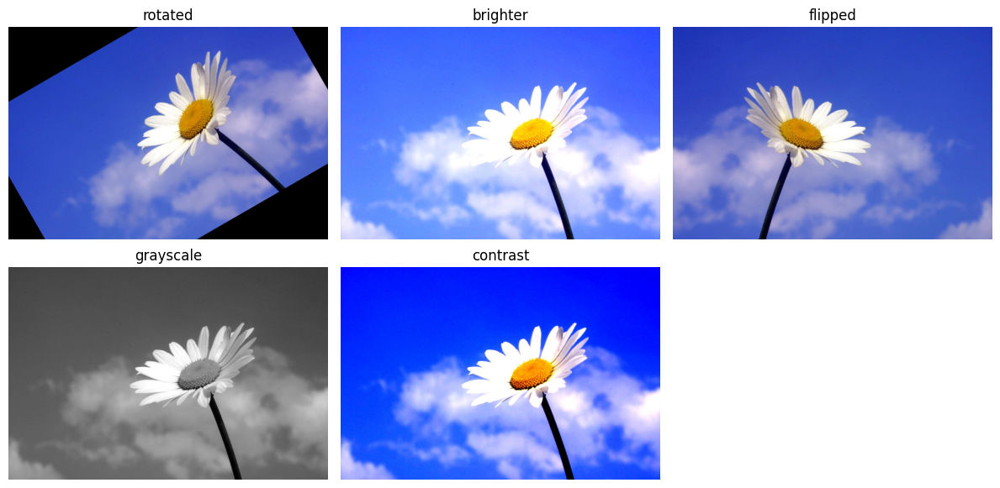

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import os

augmented_dir = "augmented_images"

augmented_images = os.listdir(augmented_dir)

plt.figure(figsize=(12, 6))

for i, img_file in enumerate(augmented_images):
    image_path = os.path.join(augmented_dir, img_file)
    img = Image.open(image_path)

    plt.subplot(2,3,i+1)
    plt.imshow(img, cmap = "gray" if img.mode =='L' else None)
    plt.title(img_file.split('.')[0])
    plt.axis('off')

plt.tight_layout()
plt.show()

EDGE FILTERING